# Feature Extraction from Convolutional Neural Networks #
### Tuan Le ###
### tuanle@hotmail.de ###

This Notebook has the purpose to visualize the activation from layers within a convolutional neural network. As trained models VGG16 and VGG19 [[link to paper]](https://arxiv.org/abs/1409.1556) will be used  using pre-trained weights by Keras-Team.  
  
One possible example why intermediate layers are useful is that the output of those layers from a convolutional neural network can be used to synthesize artworks as done in the paper [A Neural Algorithm of Artistic Styles](https://arxiv.org/abs/1508.06576).  
  
Note that this notebook will download the VGG16 and VGG19 model (architecture + weights) (**without dense layers**) and save them into your `.keras/models` subdirectory, if it is not available.  

#### Load Modules ####

In [1]:
## Ignore warnings
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [2]:
### Load trained model modules
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19

### Load image processing modules
from keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

### Load additional modules for feature extraction
from keras.models import Model

Using TensorFlow backend.


#### Define image path ####

In [3]:
img_path = "amstaff.jpg"

#### Load the image ####

<class 'numpy.ndarray'>
Shape of image is:  (224, 224, 3)
Adding index axis.
Shape of image is:  (1, 224, 224, 3)
(1, 224, 224, 3)
Max value in tensor is:  255.0
Apply normalization.
Plotting image:


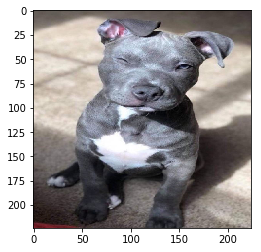

In [4]:
img224 = image.load_img(path=img_path, grayscale=False, color_mode="rgb", target_size=(224,224), interpolation="nearest")
img_tensor224 = image.img_to_array(img=img224, data_format="channels_last", dtype="float32")

print(type(img_tensor224))
print("Shape of image is: ", img_tensor224.shape)
## Include "index/batch" axis
print("Adding index axis.")
img_tensor224 = np.expand_dims(img_tensor224, axis=0)
print("Shape of image is: ", img_tensor224.shape)
print(img_tensor224.shape)
print("Max value in tensor is: ", img_tensor224.max())

## Scale the image tensor because all 4 models were preprocessed with normalization
print("Apply normalization.")
img_tensor224 /= img_tensor224.max()

## Plot the image:
print("Plotting image:")
plt.imshow(img_tensor224[0])
plt.show()

#### Helpers ####

In [5]:
def get_layer_names(model, verbose=False):
    layer_names = []
    for layer in model.layers:
        if verbose:
            print(layer.name)
        layer_names.append(layer.name)
    return layer_names

def check_valid_layer_name(model, layer_name):
    layer_names = [layer.name for layer in model.layers]
    check_val = layer_name in layer_names
    return  check_val

def get_layer_output(model, layer_name):
    assert check_valid_layer_name(model, layer_name), ("layer_name '{}' not included in model! Check layer_name variable.".format(layer_name))
    try:
        intermediate_layer_model = Model(inputs=model.input,
                                         outputs=model.get_layer(layer_name).output)
        
        return intermediate_layer_model
    except ValueError as ve:
        print(ve)

## VGG16 ##

In [6]:
vgg16 = VGG16(weights="imagenet", include_top=False)

In [7]:
print(vgg16.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

input_1
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool
(1, 224, 224, 64)


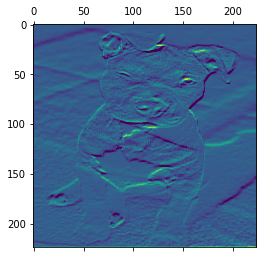

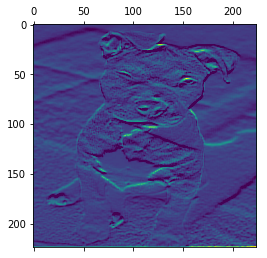

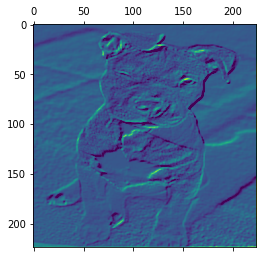

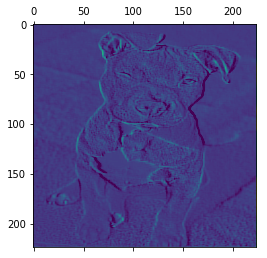

In [8]:
model_names = get_layer_names(vgg16, verbose=True)

## Extract output from first convolutional layer "block1_conv1"
first_conv_layer_output = get_layer_output(vgg16, layer_name="block1_conv1")
## Get activations from first convolutional layer
activations_first_conv_layer = first_conv_layer_output.predict(img_tensor224)
print(activations_first_conv_layer.shape)
## Visualization without postprocessing:
## Visualize 3rd filter:
plt.matshow(activations_first_conv_layer[0, :, :, 4-1])
## Visualize 10th filter:
plt.matshow(activations_first_conv_layer[0, :, :, 11-1])
## Visualize 20th filter:
plt.matshow(activations_first_conv_layer[0, :, :, 21-1])
## Visualize 64th (last) filter:
plt.matshow(activations_first_conv_layer[0, :, :, 64-1])

#### Define plot activations function to visualize (all) wanted filters####

In [9]:
def plot_activations(model, img_tensor, layer_names=None, images_per_row=16, verbose=False, do_postprocess=True):
    if layer_names is None:
        ## Get layer_names (except the first one, because it is the input layer)
        layer_names = [layer.name for layer in model.layers][1:]
    else:
        ## Check if names in layer_names are valid names
        checks = []
        for layer_name in layer_names:
            checks.append(check_valid_layer_name(model=model, layer_name=layer_name))
        checks = np.array(checks)
        if not np.sum(checks) == len(layer_names):
            raise ValueError('layer_names incorrect')
    ## Create keras model using functional API mapping one input to several layer outputs
    layer_outputs = [layer.output for layer in model.layers[1:]]
    intermediate_models = Model(inputs=model.input, outputs=layer_outputs)
    if verbose:
        print("Intermediate models summary:")
        print(intermediate_models.summary())
    ## Display feature maps
    activations = intermediate_models.predict(img_tensor)
    for layer_name, layer_activation in zip(layer_names, activations):
        ## Get number of features/filters in the feature map
        n_filters = layer_activation.shape[-1]
        ## The feature map has shape (1, size, size, n_filters)
        size = layer_activation.shape[1]
        ## Divide the activation channels/filters into matrix
        n_cols = n_filters // images_per_row
        ## Init empty numpy matrix
        display_grid = np.zeros(shape=(size*n_cols, images_per_row*size))
        
        ## Divide each filter into big horizontal grid
        for col in range(n_cols):
            for row in range(images_per_row):
                ## Get base filter image, note this has shape = (size,size)
                filter_image = layer_activation[0,
                                                 :, :,
                                                 col*images_per_row+row]
                if do_postprocess:
                    ## Postprocess the features in filter to make it visually palatable
                    filter_image -= filter_image.mean()
                    filter_image /= filter_image.std()
                    filter_image *= 64
                    filter_image += 128
                    filter_image = np.clip(a=filter_image, a_min=0, a_max=255).astype("uint8")
                
                ## Populate filter_image into the display_grid matrix
                display_grid[col*size:(col+1)*size,
                             row*size:(row+1)*size] = filter_image
        
        ## Display the grid
        scale = 1./size
        plt.figure(figsize=(scale*display_grid.shape[1],
                            scale*display_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
    plt.show()
    return None

### VGG 16 ###

In [10]:
print(vgg16.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

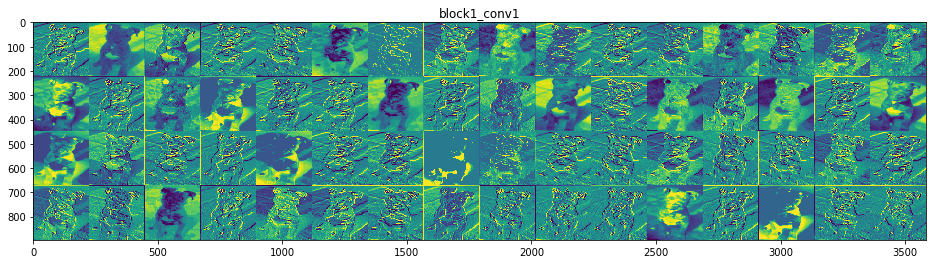

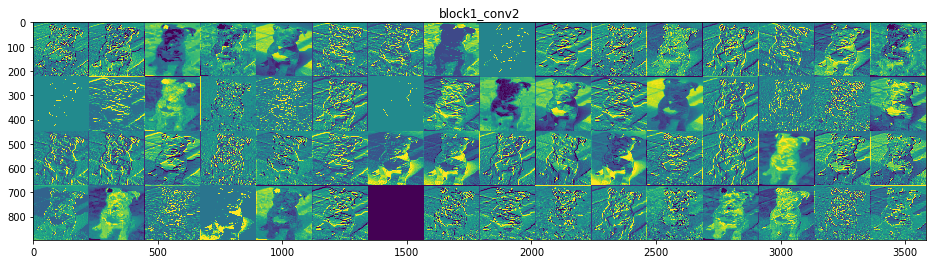

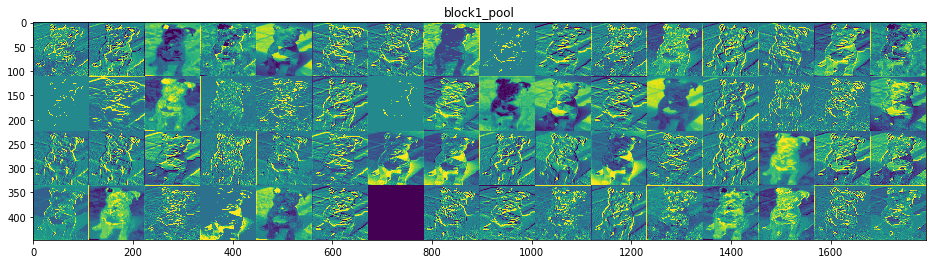

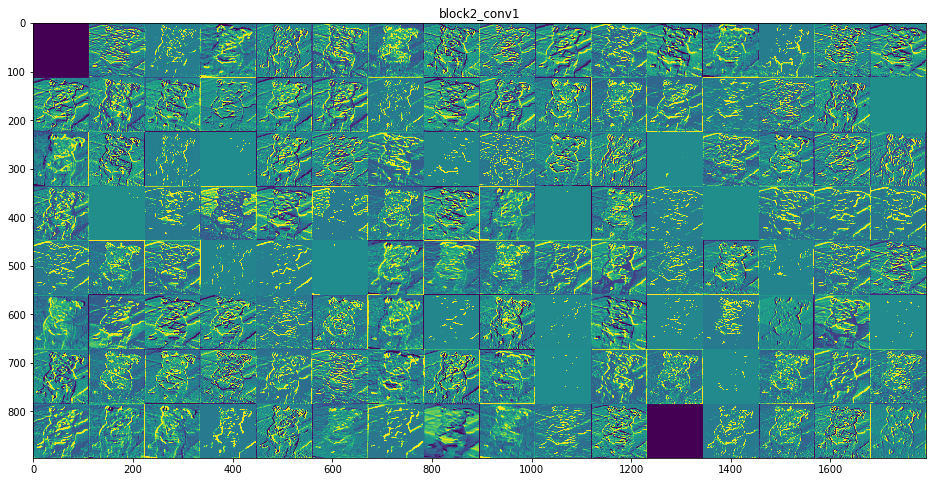

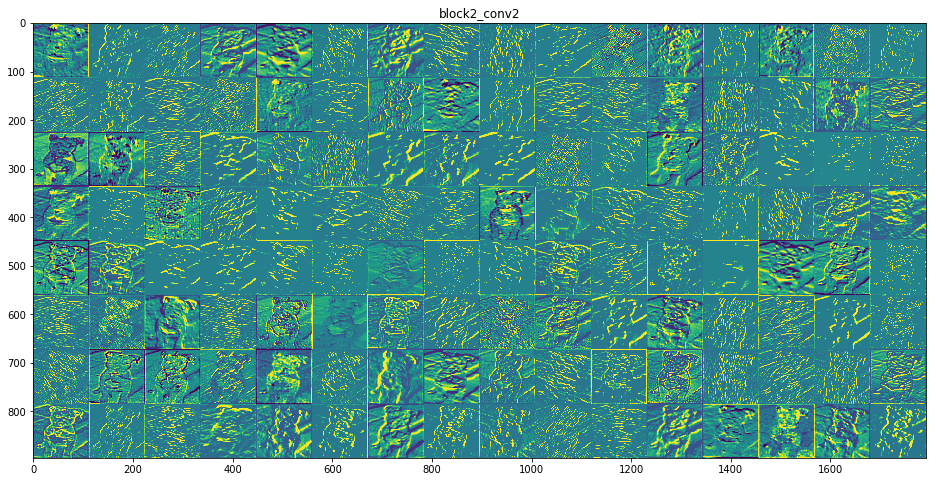

...

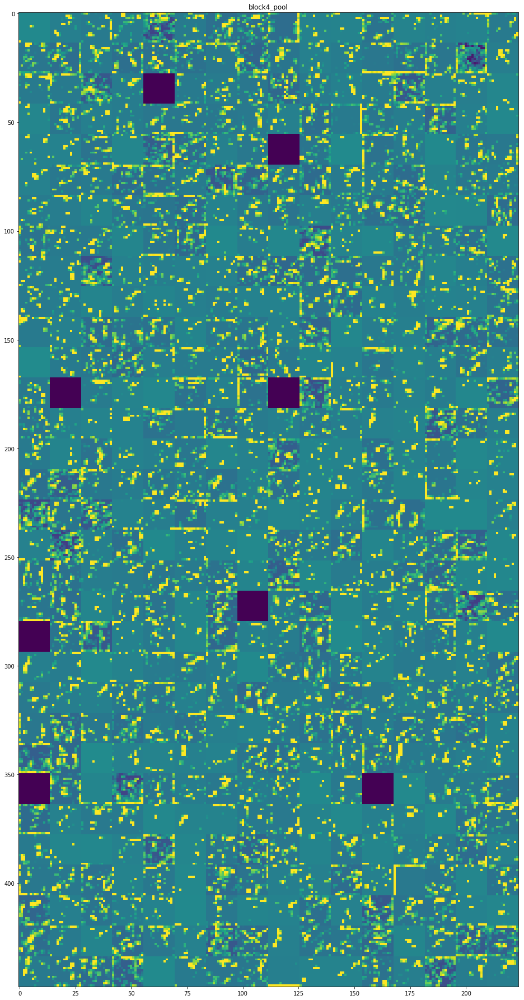

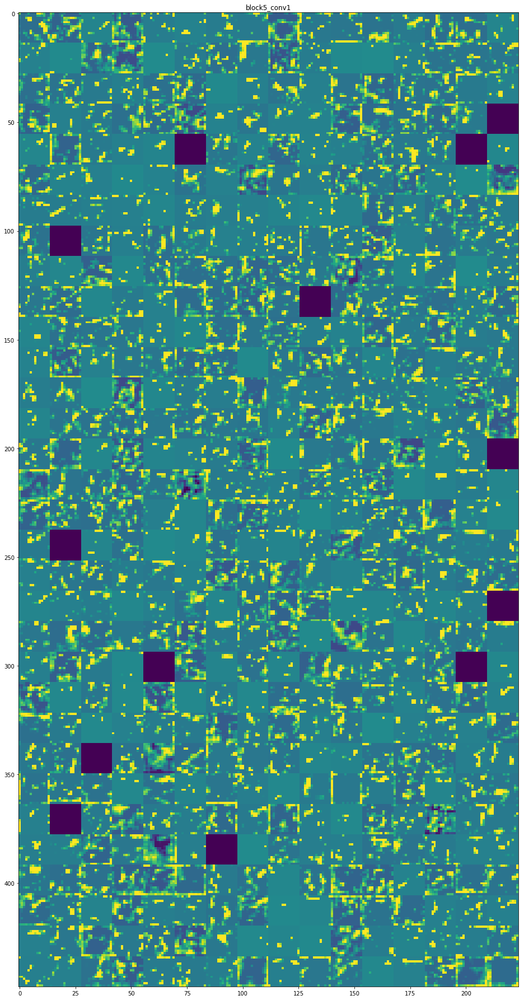

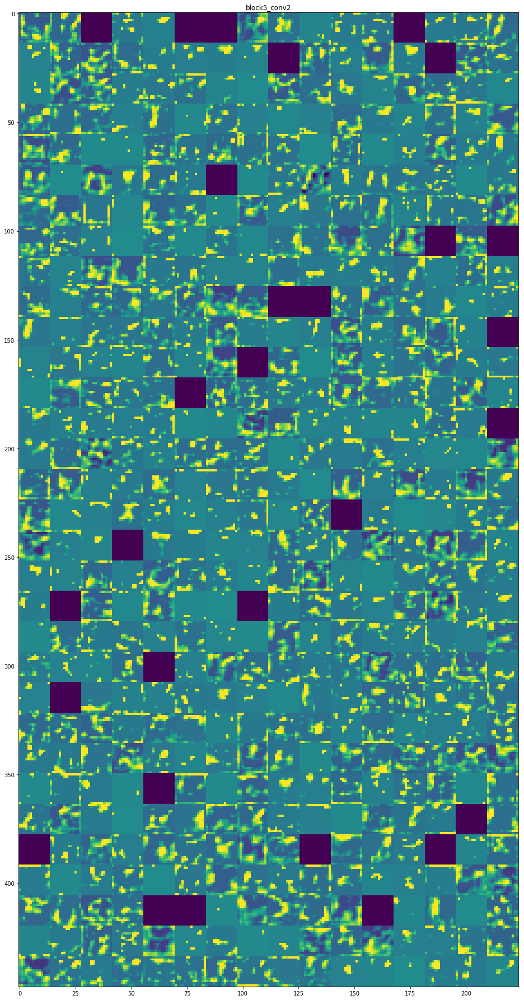

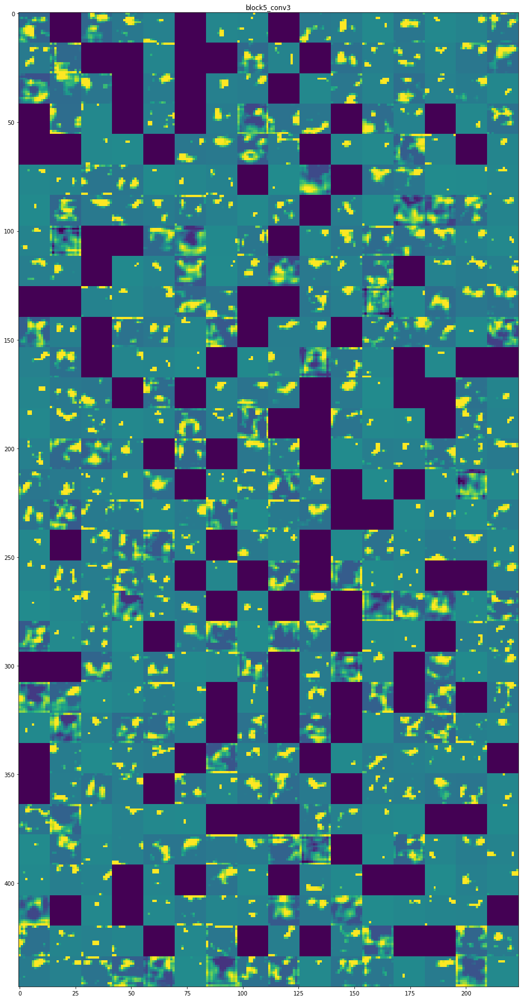

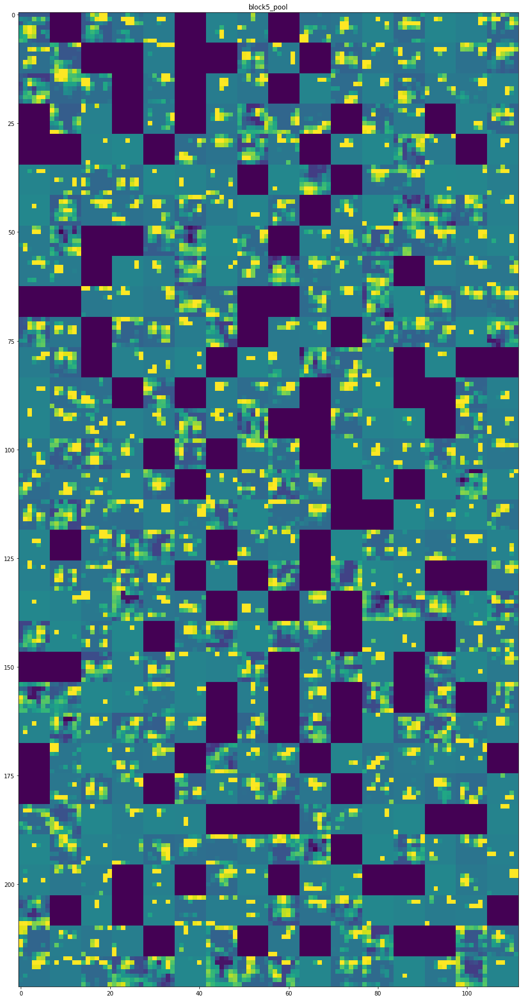

In [11]:
plot_activations(model=vgg16, img_tensor=img_tensor224, images_per_row=16, verbose=False, do_postprocess=True)

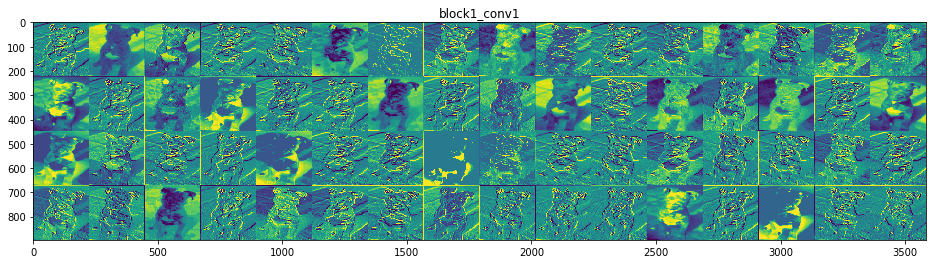

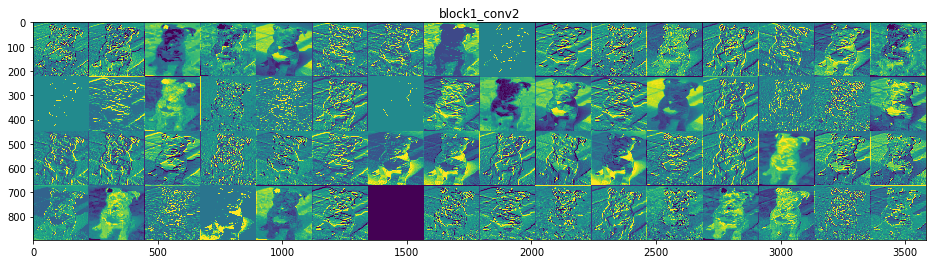

In [12]:
plot_activations(model=vgg16, layer_names = ["block1_conv1", "block1_conv2"], img_tensor=img_tensor224, images_per_row=16, verbose=False, do_postprocess=True)

### This should throw an Error ###

In [13]:
plot_activations(model=vgg16, layer_names = ["block1_conv1", "foobar"], img_tensor=img_tensor224, images_per_row=16, verbose=False, do_postprocess=True)

ValueError: layer_names incorrect

### VGG19 ###

In [14]:
vgg19 = VGG19(weights="imagenet", include_top=False)

In [15]:
print(vgg19.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0         
__________

In [16]:
#plot_activations(model=vgg19, img_tensor=img_tensor224, images_per_row=16, verbose=False, do_postprocess=True)

# End #